# **Deep Learning: Dog-Breed Prediction**

In [2]:
print("Hello  DL")

Hello  DL


In [3]:
# !unzip "/content/drive/MyDrive/Colab Notebooks/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION"

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## 2. Data
The data we are using from Kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
Submission are evaluated on `Multi Class Log Loss` between the predicted probability and the observed target.

## 4. Features
Total 120 features ( i.e. 120 breeds of dogs)
There are around 10,000+ images in both training and testing set each

## 5. Modelling

## 6. Tuning

### Get our Workspace Ready
  * import Tensorflow 2.x
  * import Tensorflow Hub
  * Make sure we're using GPU

# ⚠️ Important Notice: TensorFlow 2.16+ and Keras 3 Compatibility Issues

If you're encountering any of the following issues:

- Errors with `tf.keras.layers.Layer`, `KerasLayer`, or `KerasTensor`
- Error: `'NoneType' object has no attribute 'items'`
- Loss and accuracy being 0 every second epoch
- `ValueError: Exception encountered when calling Sequential.call()`
- Other strange/unexpected behaviors in TensorFlow (TF)

And you're using **TensorFlow 2.16 or newer**, the reason is likely due to **Keras 3** being introduced in TF 2.16+, which breaks backward compatibility with older Keras APIs.

---

## ✅ Solutions

### Option 1: Use `tf_keras` (Best Option for Now)

TF 2.16+ supports a backwards-compatible version of Keras (Keras 2) under the module `tf_keras`. Here's how to use it:

1. **Install `tf_keras`** (if not already installed):
   ```bash
   pip install tf_keras
   ```

2. **Update your code:**
   - Replace all instances of:
     ```python
     import tensorflow.keras as keras
     ```
     with:
     ```python
     import tf_keras as keras
     ```

   - Replace **all** `tf.keras` references with just `keras`:
     ```python
     # Old:
     tf.keras.layers.Dense(...)
     # New:
     keras.layers.Dense(...)
     ```

   - Replace all imports that start with `tensorflow.keras` with `tf_keras`:
     ```python
     # Old:
     from tensorflow.keras.models import Sequential
     # New:
     from tf_keras.models import Sequential
     ```

   **Note:** Do **not** change anything else from `tf.` except `tf.keras`.

3. **If using helper scripts** (like `helper_functions.py`):
   - Make sure those files **also use `tf_keras`** instead of `tf.keras`.
   - Any helper (e.g., TensorBoard callback) using `tf.keras` will break your code if not updated.

---

### Option 2: Downgrade TensorFlow

If you don’t want to refactor code, another temporary fix is to downgrade TensorFlow to **2.15 or earlier**.

```bash
pip install tensorflow==2.15.0
```

---

## 🔗 Official Reference

More details here:  
👉 [Keras Backwards Compatibility (TF-Keras 2)](https://keras.io/getting_started/#tensorflow--keras-2-backwards-compatibility)

---


In [4]:
import pandas as pd
import numpy as np
import tensorflow as tf
import tf_keras as keras

In [5]:
print("TF version: ", tf.__version__)

TF version:  2.18.0


In [6]:
import tensorflow_hub as hub
print("TF HUB version: ", hub.__version__)

TF HUB version:  0.16.1


In [7]:
# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


In [8]:
import tensorflow as tf
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)

def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)

# We run each op once to warm up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times.
print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')
print('CPU (s):')
cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images (batch x height x width x channel). Sum of ten runs.
CPU (s):
3.6371901289999755
GPU (s):
0.11758620599999858
GPU speedup over CPU: 30x


## Getting our data ready (turning into Tensors)

With all ml models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation).

In [9]:
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [10]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [11]:
labels_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [12]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


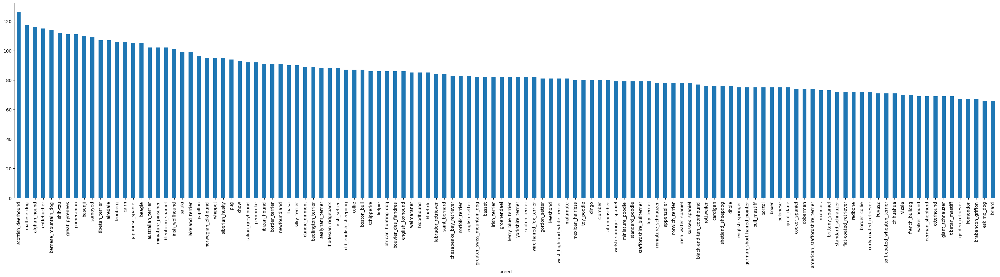

In [13]:
labels_csv["breed"].value_counts().plot.bar(figsize=(40, 8));

In [14]:
labels_csv["breed"].value_counts().mean()

np.float64(85.18333333333334)

In [15]:
labels_csv["breed"].value_counts().median()

82.0

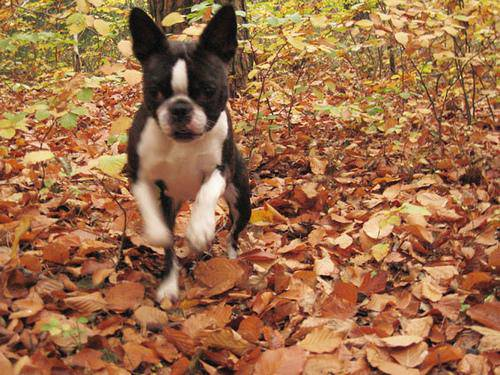

In [16]:
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels
Lets get a list of all of our file pathnames

In [17]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:5]

['drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [18]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames don't match actual amount of files, check the actual directory.")

Filenames match actual amount of files


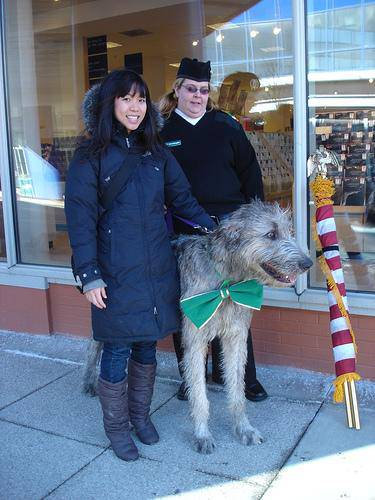

In [19]:
# one more check
Image(filenames[999])

In [20]:
labels_csv["breed"][999]

'irish_wolfhound'

**Since we've now got our training image filepaths in a list, let's prepare our labels.**

In [21]:
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [22]:
len(labels)

10222

In [23]:
# check the number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels doesn't match number of filenames, check data directories")

Number of labels matches number of filenames


In [24]:
# find the unique label values
unique_breeds = np.unique(labels)
unique_breeds[:20], len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull'], dtype=object),
 120)

## **Turning Data Labels into Numbers**

In [25]:
# turn every labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [26]:
len(boolean_labels)

10222

In [27]:
# Example : turning boolean arrays into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # on the index above, there is a 1

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### **Creating our own validation set**

In [28]:
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [29]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000}

In [30]:
# lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=21)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [31]:
X_train[:2], y_train[:2]

(['drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/0296633efc21006e3ce2af7eaeff04f7.jpg',
  'drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/0326344e0d5181130c28d25edd5627e4.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,  True, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
   

## **Pre-processing Images(Turning Images into Tensors)**

1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values form 0-255 to 0-1)
5. Resize the `image` to be a shape of(224, 224)
6. Return the modified `image`

In [32]:
# convert image to numpy array
from matplotlib.pyplot import imread

image = imread(filenames[999])
image.shape

(500, 375, 3)

In [33]:
image[:2]

array([[[ 41,  58, 102],
        [102, 125, 166],
        [105, 140, 172],
        ...,
        [ 81, 155, 230],
        [ 81, 155, 230],
        [ 81, 155, 230]],

       [[ 42,  59, 103],
        [100, 123, 164],
        [107, 142, 174],
        ...,
        [ 99, 167, 238],
        [101, 169, 240],
        [103, 171, 242]]], dtype=uint8)

In [34]:
image.max(), image.min() # rgb(0, 255)

(np.uint8(255), np.uint8(0))

In [35]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 375, 3), dtype=uint8, numpy=
array([[[ 41,  58, 102],
        [102, 125, 166],
        [105, 140, 172],
        ...,
        [ 81, 155, 230],
        [ 81, 155, 230],
        [ 81, 155, 230]],

       [[ 42,  59, 103],
        [100, 123, 164],
        [107, 142, 174],
        ...,
        [ 99, 167, 238],
        [101, 169, 240],
        [103, 171, 242]]], dtype=uint8)>

In [36]:
# define image size
IMG_SIZE = 224

# Create a function for pre-processing iamges
def process_images(image_path):
  # read the image file
  image = tf.io.read_file(image_path)

  # Turn the jpg/jpeg image into numerical tensor with 3 colour channels (RED, GREEN, BLUE)
  image = tf.image.decode_jpeg(image, channels=3)

  # convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired size value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image



### **Turning our data into batches**

Let's say we are trying to process 10K+ iamges in one go ... then all might not fit into the memory.

So that's why we do about 32 images (this is batch size) at a time.

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
`**(imgae, label)**`.

In [37]:
# create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  image = process_images(image_path)
  return image, label

In [38]:
# demo of above
(process_images(X[21]), tf.constant(y[21]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.32450607, 0.3872512 , 0.34411392],
         [0.3294993 , 0.39224443, 0.34910715],
         [0.3056723 , 0.37510508, 0.32862395],
         ...,
         [0.15686275, 0.15294118, 0.17254902],
         [0.15686275, 0.15294118, 0.17254902],
         [0.15686275, 0.15294118, 0.17254902]],
 
        [[0.29259455, 0.35533965, 0.3122024 ],
         [0.30793193, 0.37067702, 0.32753977],
         [0.27989572, 0.3493285 , 0.3028474 ],
         ...,
         [0.15686275, 0.15294118, 0.17254902],
         [0.15686275, 0.15294118, 0.17254902],
         [0.15686275, 0.15294118, 0.17254902]],
 
        [[0.2529237 , 0.3156688 , 0.27253154],
         [0.28007704, 0.34282213, 0.29968488],
         [0.24635856, 0.3157913 , 0.26931024],
         ...,
         [0.15686275, 0.15294118, 0.17254902],
         [0.15686275, 0.15294118, 0.17254902],
         [0.15686275, 0.15294118, 0.17254902]],
 
        ...,
 
        [[0.13556604, 0.33556607

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, lets make a function to turn all of our data (`X` & `y`) into batches.

In [39]:
# define the batch size
BATCH_SIZE = 32

# create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if its validation data.
    Aslo accepts test data as input(no label)
    """
    # if the data is a test dataset, we probably don't have labels
    if test_data:
        print("Creating test data batches..")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
        # Map the process_images function *before* batching
        data_batch = data.map(process_images).batch(BATCH_SIZE)
        return data_batch

    # if the data is valid dataset, we don't need to shuffle it
    elif valid_data:
        print("Creating validation data batches..")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        # Map the get_image_label function *before* batching
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

    # if valid_data is false and test_data is false, then its obviously a training dataset
    else:
        print("Creating trainging data batches..")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        data = data.shuffle(buffer_size=len(X))
        # Map the get_image_label function *before* batching
        data = data.map(get_image_label)
        data_batch = data.batch(BATCH_SIZE)
        return data_batch



In [40]:
# creating training and validation batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating trainging data batches..
Creating validation data batches..


In [41]:
# checkout the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### **Visualizing the data batches**

In [42]:
import matplotlib.pyplot as plt

# creae a function for viewing images in a data batch
def show_25_images(images, labels):
    """
    Displays 25 images and labels from a data batch.
    """
    # Setup the figure
    plt.figure(figsize=(13, 10))

    # loop through 25 (for displaying 25 images)
    for i in range(25):
        ax = plt.subplot(5, 5, i+1)
        plt.imshow(images[i])
        plt.axis("off")
        plt.title(unique_breeds[labels[i].argmax()])

In [43]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

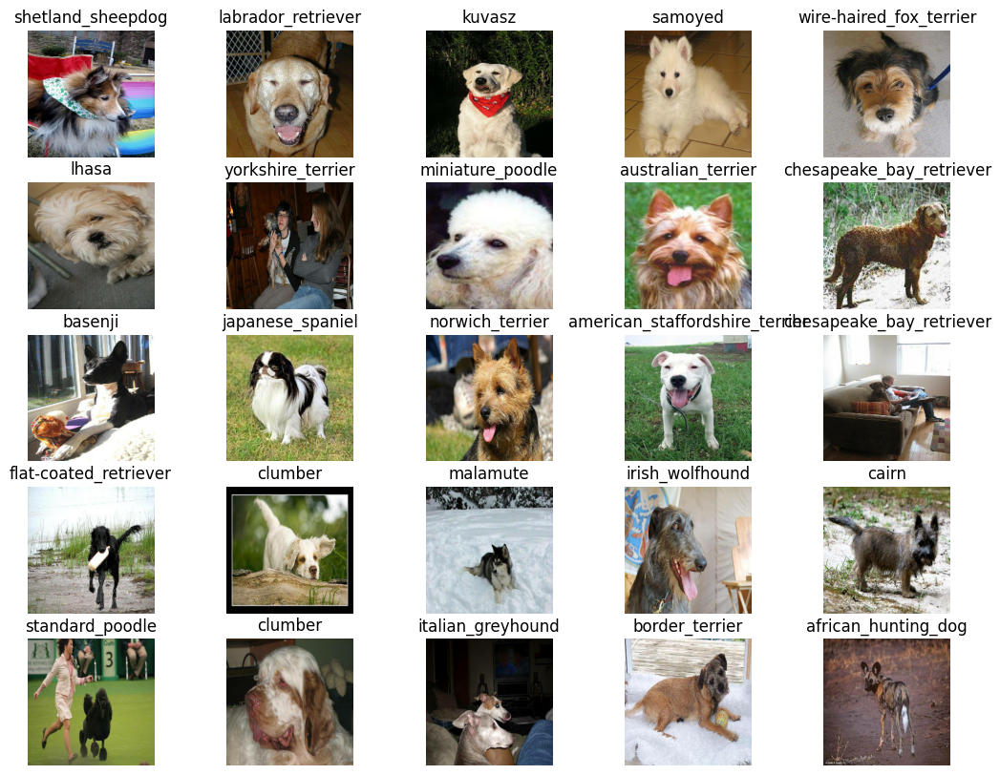

In [44]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

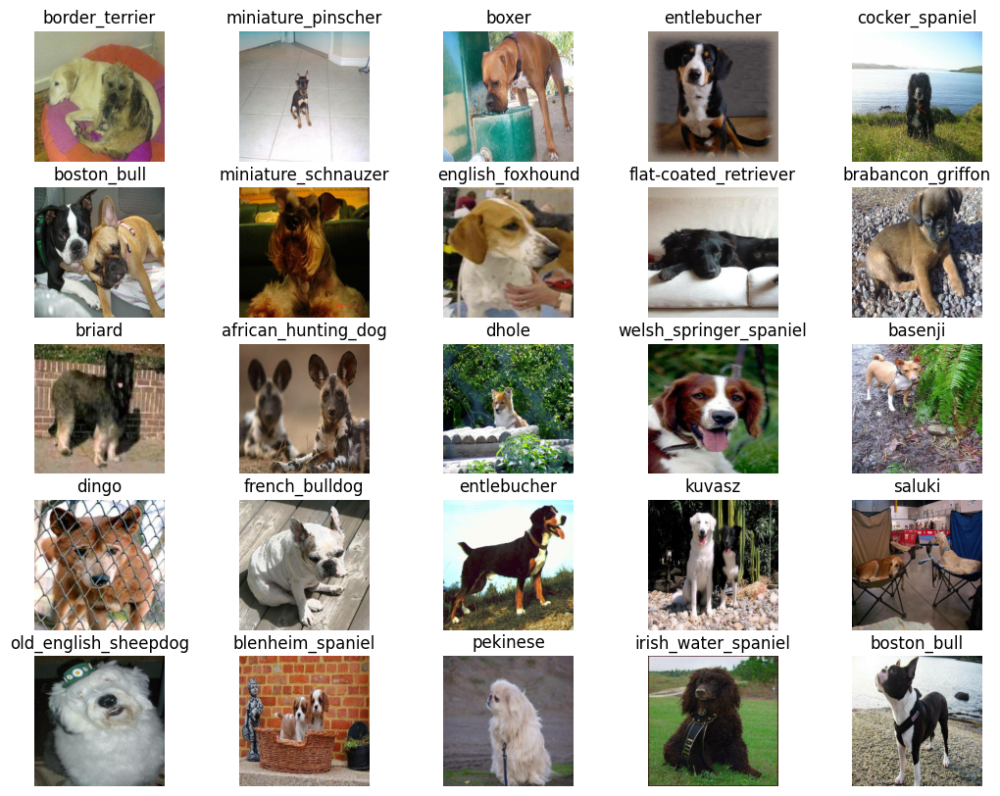

In [45]:
# now lets visualize our valid dataset
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### ***Preparing our Input and Outputs Shapes***

In [46]:
IMG_SIZE

224

In [47]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)

INPUT_SHAPE, OUTPUT_SHAPE

([None, 224, 224, 3], 120)

In [48]:
# Setup model URL from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

## ***Lets Build The Model:***

In [49]:
import tf_keras as keras

# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # setup the model layers
  model = keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = keras.losses.CategoricalCrossentropy(),
      optimizer = keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [50]:
MODEL = create_model()
MODEL.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### **Creating callback**
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

***Setup:***
1. Load the tensorboard notebook extension
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [51]:
# Load Tensorboard notebook extension
%load_ext tensorboard

import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
    # create a log directory for storing TensorBoard logs
    logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/logs",
                          # make it so the logs get tracked whenever we run an experiment
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return keras.callbacks.TensorBoard(logdir)



In [52]:
# early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3) # patience is the number of epoch after which no improvement

## ***Training a model (on subset of data)***

Our first model is only going to train on 1000 images, to make sure everything is working.

In [53]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [54]:
# check to make sure we're still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


### lets create a function which trains a model
1. create a model using `create_model()`
2. setup a tensorboard using `create_tensorboard_callback()`
3. call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for `(NUM_EPOCHS)` and the callback we'd like to use
4. return the model


In [55]:
#  Build the function
def train_model():
    """
    Trains a given model and returns the trained version.
    """

    # create a model
    model = create_model()

    # Create new TensorBoard session everytime we train a model
    tensorboard = create_tensorboard_callback()

    # fit the model to the data passing it the callbacks we created
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              callbacks=[tensorboard, early_stopping])

    # return the fitted model
    return model

In [56]:
# %%time
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 124s 5s/step - loss: 4.6631 - accuracy: 0.0862 - val_loss: 3.4694 - val_accuracy: 0.2100
Epoch 2/100
25/25 [==============================] - 4s 174ms/step - loss: 1.6680 - accuracy: 0.6913 - val_loss: 2.1881 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 5s 204ms/step - loss: 0.5805 - accuracy: 0.9400 - val_loss: 1.6958 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 3s 125ms/step - loss: 0.2525 - accuracy: 0.9900 - val_loss: 1.5281 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 4s 155ms/step - loss: 0.1463 - accuracy: 0.9987 - val_loss: 1.4361 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 5s 183ms/step - loss: 0.0985 - accuracy: 1.0000 - val_loss: 1.3868 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================

The reason the training stopped at epoch 13 out of 100 is due to the EarlyStopping callback you configured.

You set patience=3 for the EarlyStopping callback, monitoring val_accuracy. This means that if the validation accuracy does not improve for 3 consecutive epochs, the training will stop.

### Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier, and visualize its contents.

In [57]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/DL\ DOG\ BREED\ PREDICTION/logs

<IPython.core.display.Javascript object>

### Making and Evaluating prediction using a trained model

In [58]:
# make predicitons on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 130ms/step


array([[2.0830487e-03, 4.2494209e-04, 7.4064330e-05, ..., 6.9576013e-03,
        4.2314357e-03, 3.4351659e-03],
       [2.9271421e-05, 1.4255076e-05, 1.0015897e-03, ..., 2.5641159e-03,
        1.0167892e-03, 1.6439208e-01],
       [2.3332908e-04, 3.8685506e-05, 2.5157986e-04, ..., 7.2277698e-04,
        1.2444721e-05, 2.4705820e-05],
       ...,
       [3.5876983e-03, 1.0088078e-03, 2.6588785e-05, ..., 1.7710920e-05,
        2.6527101e-03, 7.1346635e-01],
       [1.6170683e-04, 2.4723253e-04, 1.7398093e-05, ..., 4.3959179e-04,
        8.8602419e-06, 2.8363726e-04],
       [2.0791902e-04, 1.5153452e-04, 1.5060719e-05, ..., 3.5006422e-04,
        8.8241490e-05, 5.7962531e-04]], dtype=float32)

In [59]:
len(predictions[0])

120

In [60]:
np.sum(predictions[0])

np.float32(1.0)

In [61]:
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[0])}")
print(f"Max index: {np.argmax(predictions[0])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}")

Max value (probability of prediction): 0.3871716856956482
Sum: 1.0
Max index: 17
Predicted label: border_terrier


## ***Visualization and Evaluation:***

*Having the above functionality is great but we want to be able to do it at scale.*

*And it would be even better if we could see the predicted image.*

In [62]:
# turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
    """
    Turns an array of prediction probabilities into a label.
    """
    return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[21])
pred_label

'blenheim_spaniel'

In [63]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [64]:
# we have to unbatch the data to make prediction on the validation images and compare those prediction to the validation labels (truth label)
def unbatchify(data):
    """
    Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
    """

    images = []
    labels = []

    # Loop through unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])

    return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)


Now we've got ways to get:
* Prediction labels
* Validation labels(truth label)
* Validation images

Lets make some function to make these all more visualize.

In [65]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth label and image for sample n.
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    if pred_label == true_label:
      color = "green"
    else:
      color = "red"

    # Change plot title to be predicted , probability of prediction and truth label
    plt.title(f"Pred: {pred_label},\n Prob: {np.max(pred_prob):.2f},\n True: {true_label}", color=color)

    # Show the plot
    plt.show()

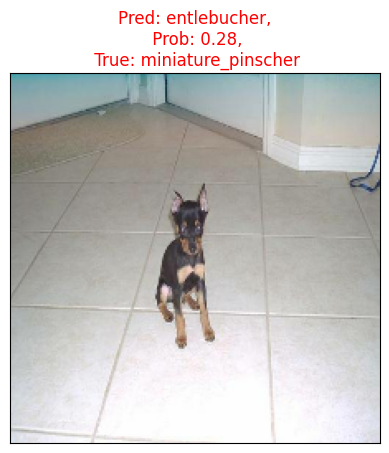

In [66]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images)

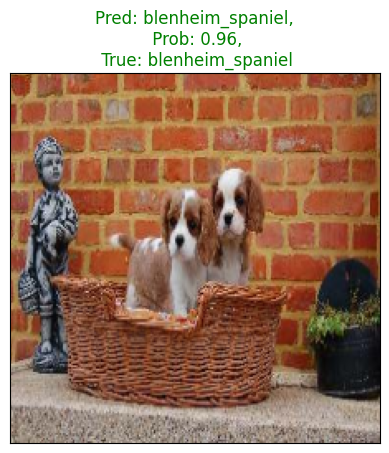

In [67]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=21)

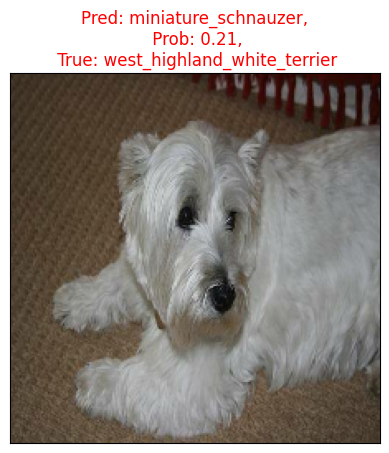

In [68]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=69)

In [69]:
# plotting top 10 highet probability predicted labels images
def plot_top_pred(prediction_probabilities, labels, n=1):
    """
    Plots the top 10 highest prediction probability for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction probability indices
    top_10_pred_inds = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_inds]

    # Find the top 10 prediction probabilities
    top_10_pred_probs = pred_prob[top_10_pred_inds]

    # setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_probs, color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

    # change the color of true label
    if np.isin(true_label, top_10_pred_labels):
      top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
      pass


In [70]:
# plot_top_pred(prediction_probabilities=predictions, labels=val_labels, n=69)

Now we've got some function to help us visualize our predictions and evaluate our mode.

## ***Saving and Loading the Trained Model:***

In [71]:
# create a function to save a model
def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix (string)
    """
    # create a model directory pathname with current time
    modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

    model_path = modeldir + "-" + suffix + ".h5" # save format of model
    print(f"Saving model to: {model_path}...")
    model.save(model_path)
    return model_path


In [72]:
# create a function to load a trained model
def load_model(model_path):
    print(f"Loading saved model from: {model_path}")
    model = keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
    return model

In [73]:
# now we've got functions to save and load the model , lets make sure they work!
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/models/20250616-11461750074382-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/models/20250616-11461750074382-1000-images-mobilenetv2-Adam.h5'

In [74]:
loaded_1000_image_model = load_model('/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/models/20250615-09331749980000-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/models/20250615-09331749980000-1000-images-mobilenetv2-Adam.h5


In [75]:
loaded_1000_image_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [76]:
# evaluate the pre-saved model:
model.evaluate(val_data)

7/7 [==============================] - 1s 104ms/step - loss: 1.2828 - accuracy: 0.6450


[1.2828054428100586, 0.6449999809265137]

In [77]:
# evaluate the post-saved model (loaded model)
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 88ms/step - loss: 1.2727 - accuracy: 0.6650


[1.2726848125457764, 0.6650000214576721]

## ***Training Full Dataset***

In [78]:
len(X), len(y)

(10222, 10222)

In [79]:
X[:1], y[:1]

(['drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/train/000bec180eb18c7604dcecc8fe0dba07.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fal

In [80]:
# create a databatch with full dataset
full_data = create_data_batches(X, y)

Creating trainging data batches..


In [81]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [82]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [83]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**NOTE**: *Running the cell below will take a longer because the GPU we're using in the runtime has to load all of the iamges into memory.*

In [84]:
%%time
# fit the full model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 42s 117ms/step - loss: 1.3050 - accuracy: 0.6751
Epoch 2/100
320/320 [==============================] - 39s 122ms/step - loss: 0.3976 - accuracy: 0.8822
Epoch 3/100
320/320 [==============================] - 38s 119ms/step - loss: 0.2380 - accuracy: 0.9335
Epoch 4/100
320/320 [==============================] - 36s 112ms/step - loss: 0.1509 - accuracy: 0.9649
Epoch 5/100
320/320 [==============================] - 36s 112ms/step - loss: 0.1064 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0796 - accuracy: 0.9855
Epoch 7/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0598 - accuracy: 0.9902
Epoch 8/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0456 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 37s 114ms/step - loss: 0.0370 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 36s 112m

In [85]:
# save the full trained model
full_path = save_model(full_model, suffix="full-dataset-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/models/20250616-11591750075171-full-dataset-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/models/20250616-11591750075171-full-dataset-mobilenetv2-Adam.h5'

In [86]:
loaded_full_model = load_model(full_path)

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/models/20250615-10101749982205-full-dataset-mobilenetv2-Adam.h5


In [87]:
loaded_full_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## ***Making Prediction on Test Dataset***
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we have created `create_data_batches()` earlier which can take a lsit of file names as input and convert them into tensors batches.

In [88]:
# load test images
test_path = "/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:5]

['/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/test/e702ddff98bd0b05ab200ffb43fb080a.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/test/e30a97eb637239e3b15c903529e04800.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/test/ddfe1bb4884e83421872030ac62835f1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/test/e3c97ed588b32f49c7aae65cf91f17ba.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/test/deec3d206b0f5c927c86ed1782990961.jpg']

In [89]:
len(test_filenames)

10357

In [90]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches..


In [91]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [92]:
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 227s 683ms/step


In [93]:
len(test_predictions)

10357

In [94]:
test_predictions

array([[6.96091683e-06, 1.27380133e-07, 1.54243480e-07, ...,
        3.96791294e-10, 6.08492314e-07, 2.80314384e-06],
       [1.36352738e-03, 4.97248198e-09, 1.17044099e-08, ...,
        9.22874843e-09, 1.58579636e-10, 6.72899466e-03],
       [4.09816980e-09, 2.19302456e-06, 4.93085253e-08, ...,
        1.56700889e-06, 2.66877520e-09, 4.34532410e-08],
       ...,
       [1.31028366e-09, 7.57776112e-13, 6.05625758e-11, ...,
        1.52497066e-07, 4.97067010e-09, 1.08632655e-07],
       [2.79692820e-08, 4.84388474e-10, 4.37126932e-11, ...,
        2.81154982e-13, 8.21150863e-08, 7.04402447e-09],
       [1.49849902e-05, 2.13035705e-07, 9.95156224e-09, ...,
        9.97752920e-08, 2.34933828e-09, 8.24839750e-04]], dtype=float32)

In [95]:
# save predictions (Numpy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/pred_arraay.csv", test_predictions, delimiter=",")

In [96]:
test_predictions_csv = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/pred_arraay.csv", delimiter=',')

In [97]:
test_predictions_csv.shape

(10357, 120)

## Preparing test dataset predictions for kaggle

In [98]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids


In [99]:
preds_df[list(unique_breeds)] = test_predictions_csv
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e702ddff98bd0b05ab200ffb43fb080a,6.960917e-06,1.273801e-07,1.542435e-07,2.886370e-09,4.703465e-10,3.197065e-10,2.931734e-09,5.651691e-09,1.909787e-09,...,2.775181e-07,2.551438e-09,1.389220e-10,1.206936e-11,2.584418e-11,1.189978e-09,1.004720e-07,3.967913e-10,6.084923e-07,2.803144e-06
1,e30a97eb637239e3b15c903529e04800,1.363527e-03,4.972482e-09,1.170441e-08,2.147014e-11,1.334605e-11,1.739781e-10,8.888055e-06,9.903490e-10,2.053329e-09,...,1.335823e-09,4.220614e-09,1.225065e-10,8.390855e-10,7.053017e-10,1.899672e-08,6.515719e-08,9.228748e-09,1.585796e-10,6.728995e-03
2,ddfe1bb4884e83421872030ac62835f1,4.098170e-09,2.193025e-06,4.930853e-08,2.069551e-06,7.258945e-06,1.552336e-06,6.714895e-09,3.426797e-08,2.168959e-08,...,1.156163e-07,1.240013e-08,5.508013e-06,4.742373e-05,1.444122e-07,1.473707e-01,9.000789e-09,1.567009e-06,2.668775e-09,4.345324e-08
3,e3c97ed588b32f49c7aae65cf91f17ba,1.066501e-04,7.950854e-10,1.926722e-09,1.464335e-08,6.925477e-07,5.469221e-07,2.062954e-11,4.115405e-09,1.550472e-07,...,1.162075e-08,1.009921e-09,8.374027e-09,2.875030e-11,4.185061e-10,9.227586e-10,5.046145e-10,3.718494e-11,1.741961e-09,1.511174e-10
4,deec3d206b0f5c927c86ed1782990961,3.042782e-12,1.078842e-11,1.139585e-11,1.589518e-08,1.252813e-08,9.311101e-08,2.344184e-11,1.939459e-12,5.845260e-12,...,1.989000e-12,1.190690e-11,1.010235e-09,3.973026e-09,2.874893e-12,1.043407e-10,4.435406e-11,2.070681e-11,8.511355e-13,4.593237e-10


In [100]:
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/submission1_mobilenetV2.csv", index=False)

In [101]:
xyz = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DL DOG BREED PREDICTION/submission1_mobilenetV2.csv")
xyz.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e702ddff98bd0b05ab200ffb43fb080a,6.960917e-06,1.273801e-07,1.542435e-07,2.886370e-09,4.703465e-10,3.197065e-10,2.931734e-09,5.651691e-09,1.909787e-09,...,2.775181e-07,2.551438e-09,1.389220e-10,1.206936e-11,2.584418e-11,1.189978e-09,1.004720e-07,3.967913e-10,6.084923e-07,2.803144e-06
1,e30a97eb637239e3b15c903529e04800,1.363527e-03,4.972482e-09,1.170441e-08,2.147014e-11,1.334605e-11,1.739781e-10,8.888055e-06,9.903490e-10,2.053329e-09,...,1.335823e-09,4.220614e-09,1.225065e-10,8.390855e-10,7.053017e-10,1.899672e-08,6.515719e-08,9.228748e-09,1.585796e-10,6.728995e-03
2,ddfe1bb4884e83421872030ac62835f1,4.098170e-09,2.193025e-06,4.930853e-08,2.069551e-06,7.258945e-06,1.552336e-06,6.714895e-09,3.426797e-08,2.168959e-08,...,1.156163e-07,1.240013e-08,5.508013e-06,4.742373e-05,1.444122e-07,1.473707e-01,9.000789e-09,1.567009e-06,2.668775e-09,4.345324e-08
3,e3c97ed588b32f49c7aae65cf91f17ba,1.066501e-04,7.950854e-10,1.926722e-09,1.464335e-08,6.925477e-07,5.469221e-07,2.062954e-11,4.115405e-09,1.550472e-07,...,1.162075e-08,1.009921e-09,8.374027e-09,2.875030e-11,4.185061e-10,9.227586e-10,5.046145e-10,3.718494e-11,1.741961e-09,1.511174e-10
4,deec3d206b0f5c927c86ed1782990961,3.042782e-12,1.078842e-11,1.139585e-11,1.589518e-08,1.252813e-08,9.311101e-08,2.344184e-11,1.939459e-12,5.845260e-12,...,1.989000e-12,1.190690e-11,1.010235e-09,3.973026e-09,2.874893e-12,1.043407e-10,4.435406e-11,2.070681e-11,8.511355e-13,4.593237e-10
